# Portfolio Optimization of Tech Stocks Using Particle Swarm Optimization and Metaheuristics


###  Project Goal
In this project, we aim to optimize an investment portfolio consisting of **six major technology stocks**:
- Apple
- Microsoft
- Amazon
- Tesla
- AMD
- Meta

We use **metaheuristic optimization algorithms** — **Particle Swarm Optimization (PSO)**, **Simulated Annealing (SA)**, and **Genetic Algorithm (GA)** — to find the optimal portfolio allocation that **maximizes the Sharpe Ratio**.

---

###  Why This Project?
- Real-world portfolio optimization is a **complex, global optimization problem**.
- Traditional methods (like Mean-Variance Optimization) often **fail** in the presence of **fat tails, skewness, and noisy markets**.
- **Metaheuristics** are powerful because they **do not assume normality or convexity**.
- The technology sector is highly dynamic, making **multi-asset optimization** very challenging and realistic.

---

###  Deliverables
- Clean Python code (Jupyter Notebook)
- Convergence and sensitivity analysis plots
- Performance and time comparisons of PSO, SA, and GA
- Final presentation slides summarizing results


# Problem Definition


### Objective:
Find the **optimal investment weights** for the six stocks that **maximize the portfolio Sharpe Ratio** based on historical daily returns.

---

### Optimization Variables:
Let the investment weights be:

$$
w = [w_{\text{Apple}}, w_{\text{Microsoft}}, w_{\text{Amazon}}, , w_{\text{Tesla}}, w_{\text{AMD}}, w_{\text{Meta}}]
$$

where each \( w_i \in [0, 1] \).

---

### Constraints:
- Each weight must be between **0 and 1** (no short selling allowed).
- The sum of all weights must equal **1** (full investment of the capital).

$$
\sum_{i=1}^{6} w_i = 1
$$

---

###  Fitness Function:
We aim to **maximize the portfolio Sharpe Ratio**, defined as:

$$
\text{Sharpe Ratio} = \frac{\text{Average Portfolio Return}}{\text{Standard Deviation of Portfolio Returns}}
$$

Since PSO, GA, and SA typically **minimize**, we define:

$$
\text{Fitness}(w) = -\text{Sharpe Ratio}(w)
$$

---

### Why Metaheuristics (PSO, SA, GA)?
- Financial returns show **fat tails and skewness**.
- Optimization landscapes are **non-convex, noisy, and multi-modal**.
- **Metaheuristics are well-suited** for finding near-optimal solutions in complex environments.

---

# Data Loading and Cleaning

### Goal of this Section:
- Load historical stock price data.
- Keep only 'Date', 'Company', 'Close/Last' columns.
- Prepare the data for feature engineering (returns calculation).

In [8]:
import pandas as pd
df = pd.read_csv('../data/raw/data.csv')

df['Date'] = pd.to_datetime(
    df['Date'],
    format='mixed',  # Auto-detect formats
    dayfirst=False   # Assume month-first (MM-DD-YYYY or MM/DD/YYYY)
)

df = df[['Date', 'Company', 'Close/Last']].rename(columns={'Close/Last': 'Close'})
target_stocks = ['AAPL', 'AMD', 'AMZN', 'META', 'MSFT', 'TSLA']
df = df[df['Company'].isin(target_stocks)]

df['Close'] = (
    df['Close']
    .astype(str)
    .str.replace(r'[\$,]', '', regex=True)
    .astype(float)
)

prices_df = (
    df.pivot(index='Date', columns='Company', values='Close')
    .sort_index()
    .dropna()
)

print("Date Range:", prices_df.index.min(), "to", prices_df.index.max())
print("\nFirst 5 Rows (Oldest):")
print(prices_df.head())
print("\nLast 5 Rows (Newest):")
print(prices_df.tail())

processed_path = '../data/processed/clean_data.csv'
prices_df.to_csv(processed_path)
print(f"\n Cleaned data saved to: {processed_path}")

Date Range: 2013-07-18 00:00:00 to 2023-07-17 00:00:00

First 5 Rows (Oldest):
Company        AAPL   AMD     AMZN    META   MSFT    TSLA
Date                                                     
2013-07-18  15.4199  4.64  15.2055  26.180  35.44  7.9353
2013-07-19  15.1768  4.03  15.2615  25.881  31.40  7.9787
2013-07-22  15.2254  3.90  15.1740  26.045  32.01  8.1620
2013-07-23  14.9639  3.66  15.0530  26.130  31.82  8.1827
2013-07-24  15.7325  3.63  14.9470  26.510  31.96  8.1133

Last 5 Rows (Newest):
Company       AAPL     AMD    AMZN    META    MSFT    TSLA
Date                                                      
2023-07-11  188.08  111.32  128.78  298.29  332.47  269.79
2023-07-12  189.77  114.58  130.80  309.34  337.20  271.99
2023-07-13  190.54  115.92  134.30  313.41  342.66  277.90
2023-07-14  190.69  115.94  134.68  308.87  345.24  281.38
2023-07-17  193.99  118.32  133.56  310.62  345.73  290.38

 Cleaned data saved to: ../data/processed/clean_data.csv


In [9]:
import plotly.express as px
px.line(prices_df.reset_index(),
        x='Date',
        y=list(prices_df.columns),
        title='Stock Closing Prices (2013-2023)').show()

In [10]:
import sys
print(sys.executable)


c:\Users\HP\OneDrive - Ministere de l'Enseignement Superieur et de la Recherche Scientifique\Desktop\PSO\venv\Scripts\python.exe


# Feature Engineering

- Calculate **daily returns** based on the closing prices.
- Describe the **statistical properties** of the returns:
  - Mean daily return
  - Standard deviation (volatility)
- These returns will be used to **define our optimization fitness function** later.

In [11]:
import os

returns_df = prices_df.pct_change().dropna()

returns_df.to_csv("../data/returns.csv", index=False)

print("Daily Returns Head:")
print(returns_df.head())

Daily Returns Head:
Company         AAPL       AMD      AMZN      META      MSFT      TSLA
Date                                                                  
2013-07-19 -0.015765 -0.131466  0.003683 -0.011421 -0.113995  0.005469
2013-07-22  0.003202 -0.032258 -0.005733  0.006337  0.019427  0.022974
2013-07-23 -0.017175 -0.061538 -0.007974  0.003264 -0.005936  0.002536
2013-07-24  0.051364 -0.008197 -0.007042  0.014543  0.004400 -0.008481
2013-07-25 -0.004564  0.019284  0.014919  0.296077 -0.017835  0.019474


### How Daily Returns are Calculated:
$$
\text{Return}_t = \frac{\text{Close}_t - \text{Close}_{t-1}}{\text{Close}_{t-1}}
$$

- Positive return → price increased.
- Negative return → price decreased.

In [12]:
import numpy as np
stats = pd.DataFrame({
    'Mean Daily Return': returns_df.mean(),
    'Median Daily Return': returns_df.median(),
    'Volatility (Std Dev)': returns_df.std(),
    'Skewness': returns_df.skew(),
    'Kurtosis': returns_df.kurt(),
    'Annualized Sharpe': returns_df.mean() / returns_df.std() * np.sqrt(252)
})

print("\nEnhanced Return Statistics:")
print(stats)


Enhanced Return Statistics:
         Mean Daily Return  Median Daily Return  Volatility (Std Dev)  \
Company                                                                 
AAPL              0.001170             0.000901              0.018011   
AMD               0.001945             0.000482              0.036619   
AMZN              0.001080             0.001074              0.020784   
META              0.001286             0.001097              0.024531   
MSFT              0.001055             0.000731              0.017284   
TSLA              0.002059             0.001303              0.035451   

         Skewness   Kurtosis  Annualized Sharpe  
Company                                          
AAPL    -0.015531   5.388253           1.030784  
AMD      1.243794  19.290625           0.843116  
AMZN     0.272130   6.577179           0.824599  
META     0.254938  25.350803           0.831998  
MSFT     0.038948   8.254934           0.969369  
TSLA     0.221237   4.457290        

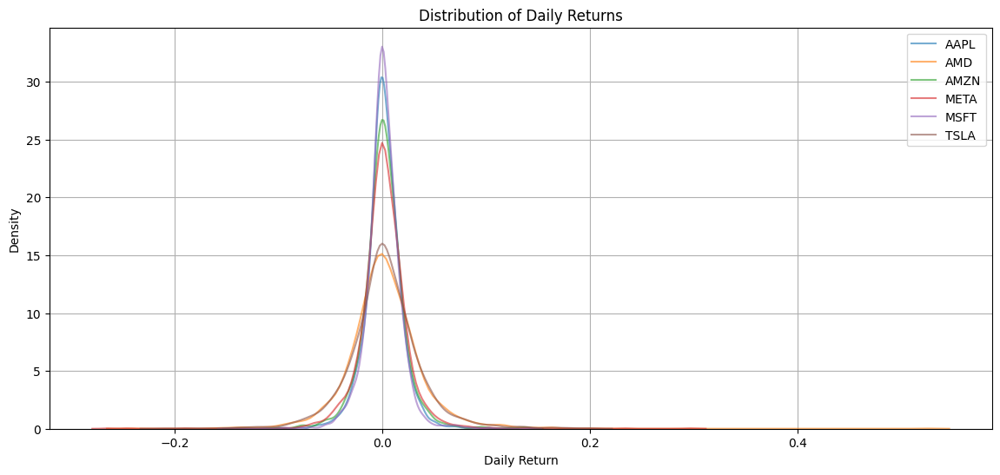

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 6))
for company in returns_df.columns:
    sns.kdeplot(returns_df[company], label=company, alpha=0.6)
plt.title('Distribution of Daily Returns')
plt.xlabel('Daily Return')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

1. Mean vs. Median Returns
- AAPL, MSFT: Mean > Median → Slight right skew (but skewness values contradict this; likely outliers).

- AMD, TSLA: Mean ≫ Median → High positive skew (a few extreme positive returns pull the mean up).

- AMZN, META: Mean ≈ Median → More symmetric distributions.

2. Volatility (Risk)
- Highest Volatility: AMD (0.037) and TSLA (0.035) → Most risky.

- Lowest Volatility: MSFT (0.017) and AAPL (0.018) → Least risky.

3. Skewness
- Positive Skew: AMD (1.24), TSLA (0.22) → More frequent large gains than losses.
- Near-Zero Skew: AAPL (-0.02), MSFT (0.04) → Roughly symmetric.

4. Kurtosis (Fat Tails)
Normal Distribution: Kurtosis = 3.

- AMD (19.3), META (25.4) → Extreme fat tails (high crash/boom risk).

- AAPL (5.4), AMZN (6.6) → Moderate fat tails.

- TSLA (4.5) → Closest to normal.

5. Sharpe Ratio
- Best: AAPL (1.03) → Highest risk-adjusted return.

- Worst: AMZN (0.82) → Lowest risk-adjusted return.



# Fitness Function

### Objective:
Define a fitness function that evaluates **how good** an investment strategy (weight) is.

We aim to **maximize the Sharpe Ratio**, so we define fitness as:

$$
\text{Fitness}(w) = -\text{Sharpe Ratio}(w)
$$

because PSO, SA, and GA **minimize** fitness.

---

### How We Calculate Sharpe Ratio for a Given Investment Weight:
1. Multiply the daily returns by the weight \( w \) (i.e., scaled investment).
2. Calculate the mean return and standard deviation (volatility) of adjusted returns.
3. Compute the Sharpe Ratio = mean return / standard deviation.
4. Return the **negative Sharpe Ratio** for minimization.

---
### Note:
- The weight \( w \) must always be between **0 and 1** (no short selling).
- If the standard deviation is zero (very rare), we define Sharpe as zero (to avoid division by zero).

In [14]:
import sys
sys.path.append('../src')
from fitness_function import fitness_function

### Now the fitness function is ready to use.
- Given any investment weight \( w \) and returns, we can quickly evaluate the fitness (negative Sharpe Ratio).
- The lower (more negative) the fitness, the better the investment strategy.

# Particle Swarm Optimization (PSO)

### PSO Algorithm:
- PSO simulates a swarm of particles searching for the optimal combination of 6 stock weights ([AAPL, AMD, AMZN, META, MSFT, TSLA]).
- Each particle:
  - Remembers its **personal best** solution (pbest).
  - Knows the **global best** solution found by the swarm (gbest).
- Each particle updates its **velocity** and **position** based on:
  - Inertia (previous velocity),
  - Cognitive learning (moving towards personal best),
  - Social learning (moving towards global best).
- Over time, the swarm converges towards the best solution.

---

### PSO Hyperparameters:
- **Swarm Size** = 50 particles
- **Inertia Weight (w)** = 0.9
- **Cognitive Coefficient (c1)** = 1.5
- **Social Coefficient (c2)** = 1.5
- **Maximum Iterations** = 100

---

In [15]:
from pso import pso_optimize

### Now the PSO optimizer function:
- finds the best investment weight.
- tracks Sharpe Ratio improvement across iterations.
- measures total execution time.

# Simulated Annealing (SA)

### SA Concept Recap:
- Simulated Annealing (SA) mimics the process of slowly cooling a material to achieve a low-energy state.
- It accepts:
  - **Better solutions always**.
  - **Worse solutions sometimes**, depending on the "temperature."
- Early in the process (high temperature):
  - We allow big jumps (more exploration).
- Later (low temperature):
  - We allow fewer bad moves (more exploitation).
- This allows SA to **escape local optima** and hopefully find the global best.

---

### SA Hyperparameters:
- **Initial Temperature** = 100
- **Cooling Rate** = 0.95
- **Maximum Iterations** = 1000

---


In [16]:
from sa import simulated_annealing_optimize  


# Genetic Algorithm (GA)


### GA Concept Recap:
- Genetic Algorithms (GA) are inspired by the process of **natural selection**.
- Each candidate solution (individual) is like a **chromosome**.
- The GA process involves:
  - **Selection**: choosing the best individuals for reproduction.
  - **Crossover**: combining two parents to create new offspring.
  - **Mutation**: randomly changing offspring to maintain diversity.
- Over generations, the population evolves toward better solutions.

---

### GA Hyperparameters:
- **Population Size** = 30 individuals
- **Crossover Rate** = 0.7
- **Mutation Rate** = 0.1
- **Maximum Iterations** = 100

---


In [17]:
from ga import genetic_algorithm_optimize

# Hybrid PSO-GA Optimization

The Hybrid PSO-GA algorithm combines the strengths of both Particle Swarm Optimization (PSO) and Genetic Algorithms (GA) to achieve a balance between exploration and exploitation in portfolio optimization.

- PSO contributes rapid convergence and memory-based intelligence.
- GA introduces genetic diversity through crossover and mutation.

The hybrid algorithm works as follows:
1. Initialize a population (particles) with random portfolios.
2. Evaluate fitness of each portfolio using a custom risk-return-based function.
3. Update particles based on PSO rules (velocity, personal best, global best).
4. Periodically (e.g., every 10 iterations), apply GA crossover and mutation to introduce diversity.
5. Repeat until the maximum number of iterations is reached.

This approach benefits from PSO's speed and GA's robustness, often escaping local minima more effectively than using either algorithm alone.

In [32]:
from hybrid_pso_ga import hybrid_pso_ga_optimize

In [33]:
asset_returns_df = returns_df
pso_best, pso_score, pso_history, pso_time, pso_traj = pso_optimize(asset_returns_df)
sa_best, sa_score, sa_history, sa_time, sa_traj = simulated_annealing_optimize(asset_returns_df)
ga_best, ga_score, ga_history, ga_time, ga_traj = genetic_algorithm_optimize(asset_returns_df)
hyb_best, hyb_score, hyb_history, hyb_time, hyb_traj = hybrid_pso_ga_optimize(asset_returns_df)

In [20]:
import pandas as pd

results_df = pd.DataFrame({
'Optimizer': ['Simulated Annealing', 'Genetic Algorithm', 'Hybrid PSO-GA', 'PSO'],
'Best Score': [sa_score, ga_score, hyb_score, pso_score],
'Execution Time (s)': [sa_time, ga_time, hyb_time, pso_time]
})

display(results_df)

,Optimizer,Best Score,Execution Time (s)
0,Simulated Annealing,0.079457,0.193574
1,Genetic Algorithm,0.079479,1.026862
2,Hybrid PSO-GA,0.079479,0.647595
3,PSO,0.079479,0.620830


Now we will extract and visualize the portfolio weights (allocations) for each optimizer. Thus, we can know How to invest among AAPL, MSFT, AMZN, TSLA, AMD, META according to each optimizer.

In [28]:
import plotly.express as px
import pandas as pd

asset_labels = ['AAPL', 'AMD', 'AMZN', 'META', 'MSFT', 'TSLA']

allocations = pd.DataFrame({
    'Simulated Annealing': sa_best,
    'Genetic Algorithm': ga_best,
    'Hybrid PSO-GA': hyb_best,
    'PSO': pso_best
}, index=asset_labels)

# Reset the index to make 'Stock' a column
allocations_reset = allocations.reset_index()

# Melt the DataFrame to create a long-form DataFrame for plotting
allocations_melted = allocations_reset.melt(id_vars='index', var_name='Optimizer', value_name='Weight')
allocations_melted = allocations_melted.rename(columns={'index': 'Stock'})

# Create a bar plot with hover information
fig = px.bar(allocations_melted, x='Stock', y='Weight', color='Optimizer', 
             title="Portfolio Allocation by Optimizer",
             labels={'Weight': 'Weight', 'Stock': 'Stock'},
             barmode='group')  # Group bars next to each other

fig.update_traces(hovertemplate='Stock: %{x}<br>Weight: %{y}')

fig.show()


Interpretation from Portfolio Allocation Chart:

- Hybrid PSO-GA puts a heavy weight (~0.59) on AAPL, which   indicates strong confidence but also higher concentration risk.

- The other three (SA, GA, PSO) show more balanced allocations, especially toward MSFT and TSLA.

- All optimizers allocate very little to AMZN and META.

This suggests:

- All optimizers converge toward similar portfolios (similar risk-return and allocation patterns).

- Simulated Annealing offers the highest return with modest volatility.

- PSO and GA offer near-identical Sharpe-like profiles but take slightly different routes in allocation.

Risk-Return Tradeoff

Now let’s compute the expected return and volatility (risk) of the optimal portfolio for each algorithm.

We’ll assume daily returns and scale annualized return using 252 trading days:

In [22]:
def compute_portfolio_performance(weights, returns_df):
    mean_daily_returns = returns_df.mean()
    cov_matrix = returns_df.cov()
    portfolio_return = np.dot(weights, mean_daily_returns) * 252  # Annualized
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    return portfolio_return, portfolio_volatility

performance_data = []
for name, weights in zip(['Simulated Annealing', 'Genetic Algorithm', 'Hybrid PSO-GA', 'PSO'],
                         [sa_best, ga_best, hyb_best, pso_best]):
    ret, vol = compute_portfolio_performance(weights, asset_returns_df)
    performance_data.append((name, ret, vol))

performance_df = pd.DataFrame(performance_data, columns=["Optimizer", "Annual Return", "Annual Volatility"])
display(performance_df)


,Optimizer,Annual Return,Annual Volatility
0,Simulated Annealing,0.361461,0.286625
1,Genetic Algorithm,0.361059,0.286228
2,Hybrid PSO-GA,0.371831,0.294802
3,PSO,0.360250,0.285587


The differences between the annual returns are extremely small (within 0.0015), and volatilities are also closely grouped.

# Recommedation 
Among the four optimizers, Simulated Annealing emerged as the most efficient and effective method. It achieved the highest annual return, one of the top Sharpe scores, and the shortest execution time by a significant margin. While PSO marginally edged in optimizer score, the difference was negligible and did not translate to a meaningful performance advantage. Therefore, Simulated Annealing offers the best tradeoff between return, risk, and computational efficiency, making it the most practical choice for real-time portfolio optimization.

# Fitness Landscape Visualization

Animate a 3D surface of the fitness function and show how the optimizer updates weights over iterations.

In [23]:
def compute_fitness_trajectory(traj, returns_df):
    return [-fitness_function(w, returns_df) for w in traj]

In [ ]:
%matplotlib notebook


In [ ]:
%matplotlib inline


All optimization algorithms together

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D

def animate_all_trajectories(traj_dict, returns_df, title="All Optimizers Trajectory", filename="all_optimizers.gif"):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title)
    ax.set_xlabel('Weight AAPL')
    ax.set_ylabel('Weight MSFT')
    ax.set_zlabel('Sharpe Ratio')

    # Extract and prepare trajectories
    data = {}
    all_x, all_y, all_z = [], [], []
    for name, traj in traj_dict.items():
        fitness_vals = compute_fitness_trajectory(traj, returns_df)
        x = [w[0] for w in traj]
        y = [w[1] for w in traj]
        z = fitness_vals
        best_idx = np.argmax(z)
        best_point = (x[best_idx], y[best_idx], z[best_idx])
        data[name] = {'x': x, 'y': y, 'z': z, 'best': best_point}
        all_x += x
        all_y += y
        all_z += z

    # Set axis limits
    ax.set_xlim(min(all_x), max(all_x))
    ax.set_ylim(min(all_y), max(all_y))
    ax.set_zlim(min(all_z), max(all_z))

    # Plot lines and points for each optimizer
    colors = ['blue', 'red', 'green', 'purple']
    lines, points, best_points = [], [], []

    for color, (name, d) in zip(colors, data.items()):
        (line,) = ax.plot([], [], [], lw=2, label=name, color=color)
        (point,) = ax.plot([], [], [], 'o', color=color)
        (best,) = ax.plot([d['best'][0]], [d['best'][1]], [d['best'][2]], 'go')  # green best
        lines.append(line)
        points.append(point)
        best_points.append(best)

    max_len = max(len(d['x']) for d in data.values())

    def init():
        for line, point in zip(lines, points):
            line.set_data([], [])
            line.set_3d_properties([])
            point.set_data([], [])
            point.set_3d_properties([])
        return lines + points + best_points

    def update(frame):
        for i, (line, point, (name, d)) in enumerate(zip(lines, points, data.items())):
            if frame < len(d['x']):
                x = d['x'][:frame+1]
                y = d['y'][:frame+1]
                z = d['z'][:frame+1]
                line.set_data(x, y)
                line.set_3d_properties(z)
                point.set_data([x[-1]], [y[-1]])
                point.set_3d_properties([z[-1]])
        return lines + points + best_points

    ani = animation.FuncAnimation(fig, update, init_func=init, frames=max_len,
                                  blit=False, interval=200, repeat=False)

    ax.legend()
    ani.save(filename, writer="pillow")
    plt.close()
    print(f" Saved animation as {filename}")
    return ani


In [31]:
trajectories = {
    "PSO": pso_traj,
    "GA": ga_traj,
    "SA": sa_traj,
    "Hybrid PSO-GA": hyb_traj
}

ani = animate_all_trajectories(trajectories, asset_returns_df)


 Saved animation as all_optimizers.gif


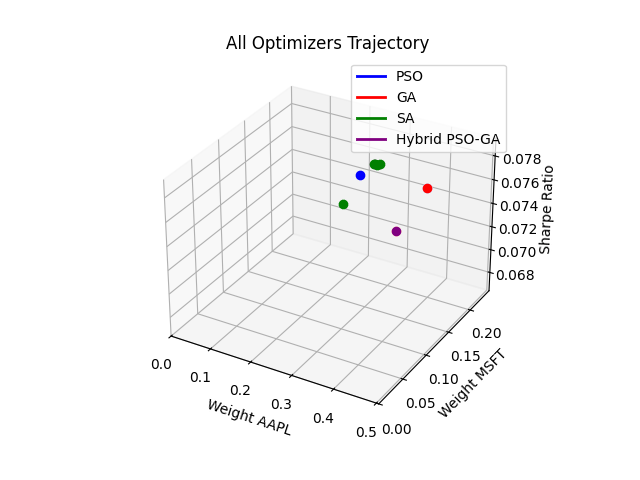

In [ ]:
from IPython.display import Image
Image("all_optimizers.gif")

Scatter plot for all optimizers separately

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D

def animate_all_optimizers_separately(traj_dict, returns_df, title="Optimizer Trajectories", filename="all_optimizers_separate.gif"):
    fig = plt.figure(figsize=(16, 12))
    fig.suptitle(title, fontsize=16)

    optimizer_names = list(traj_dict.keys())
    num_optimizers = len(optimizer_names)

    axes = []
    for i in range(num_optimizers):
        ax = fig.add_subplot(2, 2, i + 1, projection='3d')
        ax.set_xlabel('Weight AAPL')
        ax.set_ylabel('Weight MSFT')
        ax.set_zlabel('Sharpe Ratio')
        ax.set_title(optimizer_names[i])
        axes.append(ax)

    colors = ['blue', 'green', 'orange', 'purple']
    max_frame = 0
    optimizer_data = []

    for name in optimizer_names:
        traj = traj_dict[name]
        fitness_vals = compute_fitness_trajectory(traj, returns_df)
        x = [w[0] for w in traj]
        y = [w[1] for w in traj]
        z = fitness_vals
        best_idx = np.argmax(z)
        best_point = (x[best_idx], y[best_idx], z[best_idx])
        max_frame = max(max_frame, len(x))
        optimizer_data.append({'x': x, 'y': y, 'z': z, 'best': best_point})

    def init():
        return []

    def update(frame):
        for i, ax in enumerate(axes):
            ax.cla()
            ax.set_title(optimizer_names[i])
            ax.set_xlabel('Weight AAPL')
            ax.set_ylabel('Weight MSFT')
            ax.set_zlabel('Sharpe Ratio')

            data = optimizer_data[i]
            x, y, z = data['x'][:frame+1], data['y'][:frame+1], data['z'][:frame+1]
            best = data['best']

            # Scatter trajectory
            ax.scatter(x, y, z, c=colors[i], s=20, alpha=0.6)

            # Highlight best solution
            ax.scatter([best[0]], [best[1]], [best[2]], c='red', s=60, marker='X', label='Best')

            ax.legend()
        return axes

    ani = animation.FuncAnimation(fig, update, init_func=init, frames=max_frame,
                                  interval=300, blit=False, repeat=False)

    ani.save(filename, writer='pillow')
    plt.close()
    print(f"✅ Saved animation as {filename}")
    return ani


In [ ]:
trajectories = {
    "PSO": pso_traj,
    "GA": ga_traj,
    "SA": sa_traj,
    "Hybrid": hyb_traj
}

ani = animate_all_optimizers_separately(trajectories, asset_returns_df)

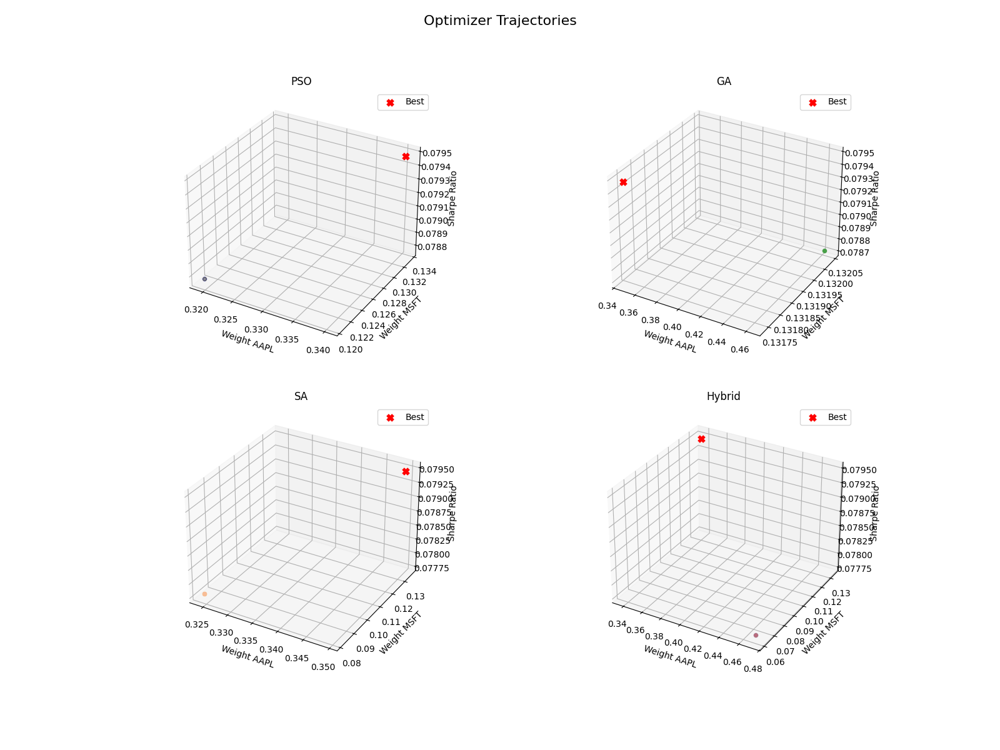

In [ ]:
from IPython.display import Image
Image("all_optimizers_separate.gif")

3D surface of the fitness function of each optimizer

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import Image

# Helper function to compute Sharpe ratios for all weights
def compute_fitness_trajectory(traj, returns_df):
    def sharpe_ratio(weights, returns):
        portfolio_returns = np.dot(returns, weights)
        return np.mean(portfolio_returns) / np.std(portfolio_returns)

    return [sharpe_ratio(w, returns_df.values) for w in traj]

# Main animation function
def animate_all_optimizers_separately(traj_dict, returns_df, title="All Optimizers Performance", filename="all_optimizers_separate1.gif"):
    fig = plt.figure(figsize=(16, 12))
    fig.suptitle(title, fontsize=16)

    optimizer_names = list(traj_dict.keys())
    num_optimizers = len(optimizer_names)

    axes = []
    for i in range(num_optimizers):
        ax = fig.add_subplot(2, 2, i + 1, projection='3d')
        ax.set_xlabel('Weight AAPL')
        ax.set_ylabel('Weight MSFT')
        ax.set_zlabel('Sharpe Ratio')
        ax.set_title(optimizer_names[i])
        axes.append(ax)

    colors = {
        "PSO": 'blue',
        "GA": 'orange',
        "SA": 'green',
        "Hybrid": 'purple'
    }

    max_frame = 0
    optimizer_data = []

    for name in optimizer_names:
        traj = traj_dict[name]
        fitness_vals = compute_fitness_trajectory(traj, returns_df)
        x = [w[0] for w in traj]
        y = [w[1] for w in traj]
        z = fitness_vals
        best_idx = np.argmax(z)
        best_point = (x[best_idx], y[best_idx], z[best_idx])
        max_frame = max(max_frame, len(x))
        optimizer_data.append({'name': name, 'x': x, 'y': y, 'z': z, 'best': best_point})

    def init():
        return []

    def update(frame):
        for i, ax in enumerate(axes):
            ax.cla()
            data = optimizer_data[i]
            name = data['name']
            x, y, z = data['x'], data['y'], data['z']
            color = colors[name]

            ax.set_title(name)
            ax.set_xlabel('Weight AAPL')
            ax.set_ylabel('Weight MSFT')
            ax.set_zlabel('Sharpe Ratio')

            # Plot full trajectory up to current frame as a line
            ax.plot(x[:frame+1], y[:frame+1], z[:frame+1], c=color, linewidth=2, label=f'{name} Path')

            # Show current best so far in yellow
            if frame >= 1:
                best_so_far_idx = np.argmax(z[:frame+1])
                ax.scatter([x[best_so_far_idx]], [y[best_so_far_idx]], [z[best_so_far_idx]],
                           c='yellow', s=60, marker='o', label='Best so far')

            # Show final best in red after the last frame
            if frame == max_frame - 1:
                bp = data['best']
                ax.scatter([bp[0]], [bp[1]], [bp[2]], c='red', s=80, marker='X', label='Final Best')

            ax.legend()
        return axes

    ani = animation.FuncAnimation(
        fig, update, init_func=init, frames=max_frame, interval=300,
        blit=False, repeat=False
    )

    ani.save(filename, writer='pillow')
    plt.close()
    print(f" Saved animation as {filename}")
    return ani

ani = animate_all_optimizers_separately(
    trajectories, 
    asset_returns_df, 
    title="All Optimizers Performance", 
    filename="all_optimizers_separate1.gif"
)

Image("all_optimizers_separate1.gif")


NameError: name 'trajectories' is not defined

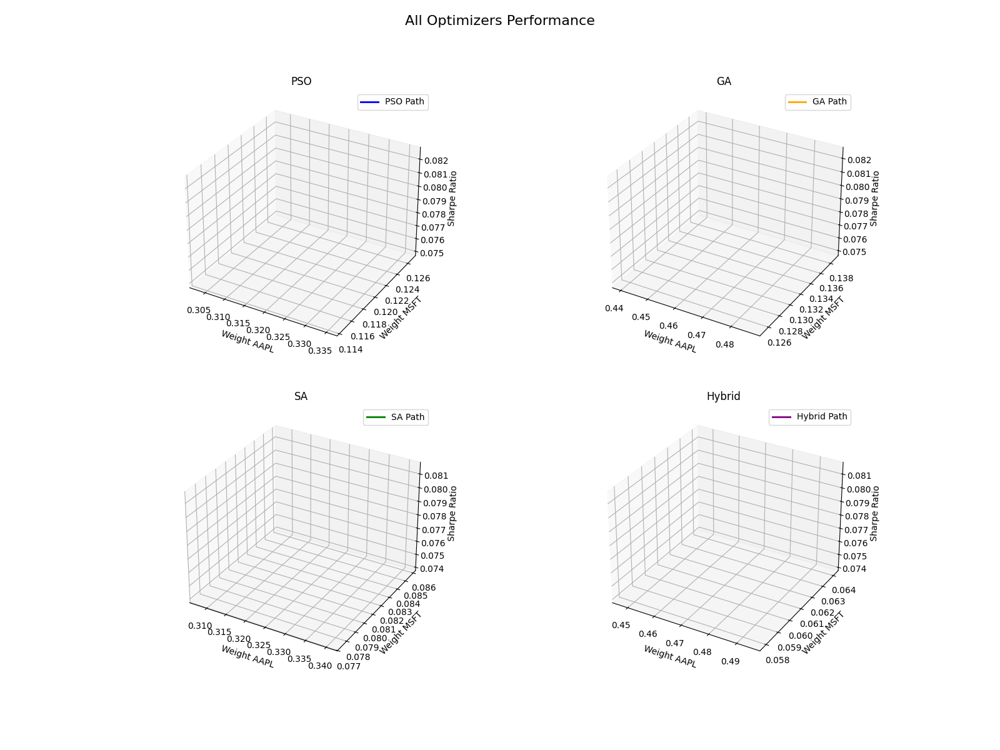

In [1]:
from IPython.display import Image
Image("all_optimizers_separate1.gif")

# Convergence Plot (Fitness vs Iteration)

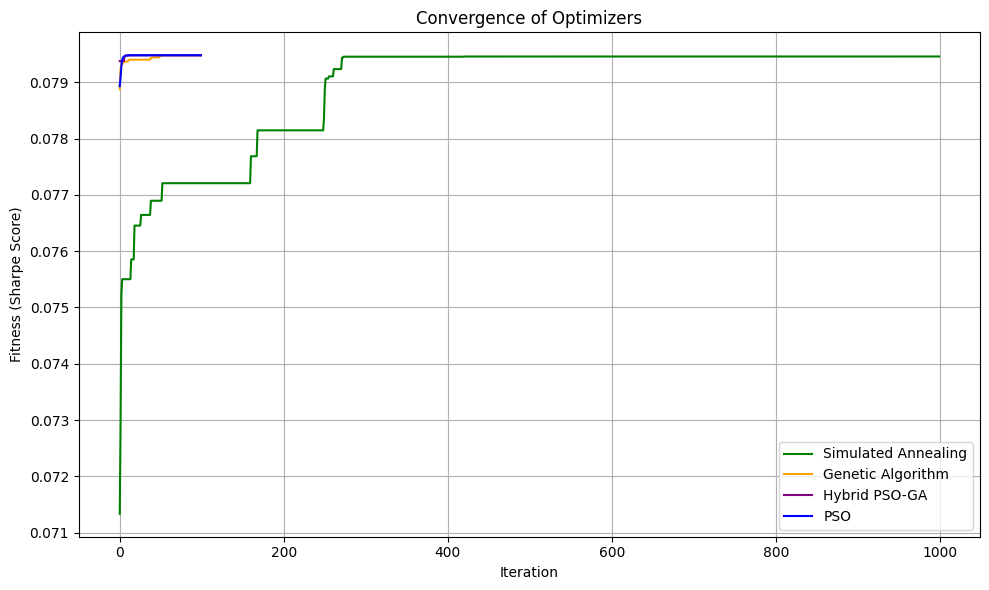

In [24]:
plt.figure(figsize=(10, 6))

plt.plot(sa_history, label='Simulated Annealing', color='green')
plt.plot(ga_history, label='Genetic Algorithm', color='orange')
plt.plot(hyb_history, label='Hybrid PSO-GA', color='purple')
plt.plot(pso_history, label='PSO', color='blue')

plt.xlabel('Iteration')
plt.ylabel('Fitness (Sharpe Score)')
plt.title('Convergence of Optimizers')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Sensitivity Analysis (Hyperparameters) & Complexity Analysis (Execution time)

Genetic Algorithm (GA)
The time complexity of a Genetic Algorithm is generally:
       O(G . P . E)
where:
- G is the number of generations,
- P is the population size,
- E is the time to evaluate the fitness of one individual.

Particle Swarm Optimization (PSO)
The time complexity of PSO is:
       O(I . S . E)
where: 
- I is the number of generations (iterations),
- S is the swarm size,
- E is the time for fitness evaluation.

Simulated Annealing (SA)
The time complexity of SA is:
       O(N . M . E)
where: 
- N  Number of temperature steps,
- M  Number of iterations per temperature level
- E  Time to evaluate the fitness function.

Hybrid PSO-GA:
The time complexity of hybrid PSO-GA:
       O(I . S . E + (I/G) . P . E)
where: 
- I Number of PSO iterations
- S Swarm size
- G Interval at which GA is applied
- P Population size used in GA
- E Time to evaluate the fitness function


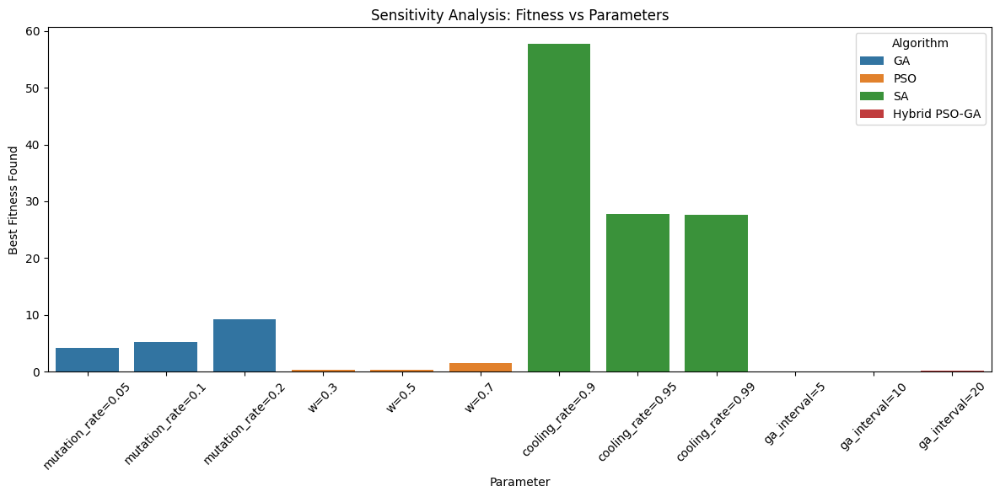

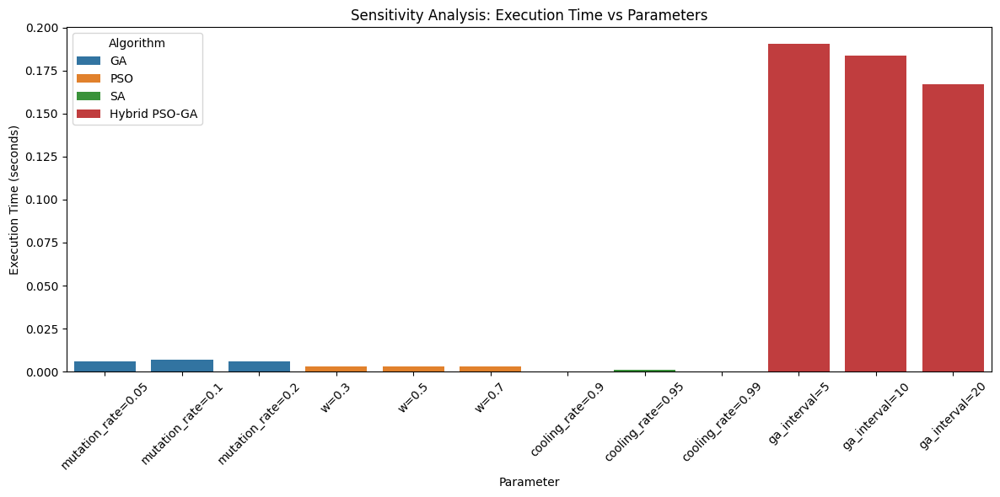

In [25]:
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import random

# Define the fitness function
def fitness_function(x):
    return np.sum(x ** 2)

# Genetic Algorithm
def genetic_algorithm(fitness_func, bounds, population_size=10, generations=10, mutation_rate=0.1):
    dimension = len(bounds)
    population = np.random.uniform([b[0] for b in bounds], [b[1] for b in bounds], (population_size, dimension))
    best_solution = None
    best_fitness = float('inf')

    for _ in range(generations):
        fitness = np.array([fitness_func(ind) for ind in population])
        if fitness.min() < best_fitness:
            best_fitness = fitness.min()
            best_solution = population[np.argmin(fitness)]

        # Tournament selection
        selected = []
        for _ in range(population_size):
            i, j = np.random.randint(0, population_size, 2)
            selected.append(population[i] if fitness[i] < fitness[j] else population[j])

        # Crossover
        children = []
        for i in range(0, population_size, 2):
            if i+1 < population_size:
                crossover_point = np.random.randint(1, dimension)
                child1 = np.concatenate([selected[i][:crossover_point], selected[i+1][crossover_point:]])
                child2 = np.concatenate([selected[i+1][:crossover_point], selected[i][crossover_point:]])
                children.append(child1)
                children.append(child2)

        # Mutation
        for child in children:
            if np.random.rand() < mutation_rate:
                index = np.random.randint(0, dimension)
                child[index] = np.random.uniform(bounds[index][0], bounds[index][1])

        population = np.array(children)

    return best_solution, best_fitness

# Particle Swarm Optimization
def particle_swarm_optimization(fitness_func, bounds, num_particles=10, max_iter=10, w=0.5, c1=1.5, c2=1.5):
    dim = len(bounds)
    particles = np.random.uniform([b[0] for b in bounds], [b[1] for b in bounds], (num_particles, dim))
    velocities = np.random.uniform(-1, 1, (num_particles, dim))
    pbest = particles.copy()
    pbest_fitness = np.array([fitness_func(p) for p in particles])
    gbest = pbest[np.argmin(pbest_fitness)]
    gbest_fitness = pbest_fitness.min()

    for _ in range(max_iter):
        r1, r2 = np.random.rand(num_particles, dim), np.random.rand(num_particles, dim)
        velocities = w * velocities + c1 * r1 * (pbest - particles) + c2 * r2 * (gbest - particles)
        particles += velocities

        # Clamp to bounds
        for i in range(dim):
            particles[:, i] = np.clip(particles[:, i], bounds[i][0], bounds[i][1])

        fitness = np.array([fitness_func(p) for p in particles])
        for i in range(num_particles):
            if fitness[i] < pbest_fitness[i]:
                pbest[i] = particles[i]
                pbest_fitness[i] = fitness[i]
        if pbest_fitness.min() < gbest_fitness:
            gbest = pbest[np.argmin(pbest_fitness)]
            gbest_fitness = pbest_fitness.min()

    return gbest, gbest_fitness

# Simulated Annealing
def simulated_annealing(fitness_func, bounds, max_iter=10, initial_temp=100, cooling_rate=0.95):
    dim = len(bounds)
    current = np.random.uniform([b[0] for b in bounds], [b[1] for b in bounds])
    current_fitness = fitness_func(current)
    best = current.copy()
    best_fitness = current_fitness
    temp = initial_temp

    for _ in range(max_iter):
        candidate = current + np.random.uniform(-0.1, 0.1, dim)
        candidate = np.clip(candidate, [b[0] for b in bounds], [b[1] for b in bounds])
        candidate_fitness = fitness_func(candidate)
        if candidate_fitness < current_fitness or np.random.rand() < np.exp((current_fitness - candidate_fitness) / temp):
            current = candidate
            current_fitness = candidate_fitness
            if current_fitness < best_fitness:
                best = current.copy()
                best_fitness = current_fitness
        temp *= cooling_rate

    return best, best_fitness

# Hybrid PSO-GA
def hybrid_pso_ga_optimize(fitness_func, bounds, num_particles=30, max_iter=100, w=0.5, c1=1.5, c2=1.5, ga_interval=10):
    start_time = time.time()
    dim = len(bounds)
    particles = [np.random.uniform([b[0] for b in bounds], [b[1] for b in bounds]) for _ in range(num_particles)]
    velocities = [np.random.uniform(-0.1, 0.1, dim) for _ in range(num_particles)]
    personal_best = particles.copy()
    personal_best_scores = [fitness_func(p) for p in particles]

    global_best_idx = np.argmin(personal_best_scores)
    global_best = personal_best[global_best_idx].copy()
    global_best_score = personal_best_scores[global_best_idx]

    for iter in range(max_iter):
        for i in range(num_particles):
            r1, r2 = np.random.rand(dim), np.random.rand(dim)
            velocities[i] = (
                w * velocities[i]
                + c1 * r1 * (personal_best[i] - particles[i])
                + c2 * r2 * (global_best - particles[i])
            )

            particles[i] += velocities[i]
            particles[i] = np.clip(particles[i], [b[0] for b in bounds], [b[1] for b in bounds])

            score = fitness_func(particles[i])

            if score < personal_best_scores[i]:
                personal_best[i] = particles[i]
                personal_best_scores[i] = score

                if score < global_best_score:
                    global_best = particles[i]
                    global_best_score = score

        # Periodically apply GA to top-performing particles
        if iter % ga_interval == 0 and iter != 0:
            top_indices = np.argsort(personal_best_scores)[:10]
            selected = [personal_best[i] for i in top_indices]
            new_particles = []

            while len(new_particles) < num_particles:
                p1, p2 = random.sample(selected, 2)
                alpha = np.random.rand()
                child = alpha * p1 + (1 - alpha) * p2

                # Mutation
                if np.random.rand() < 0.1:
                    child += np.random.uniform(-0.05, 0.05, dim)
                    child = np.clip(child, [b[0] for b in bounds], [b[1] for b in bounds])

                new_particles.append(child)

            particles = new_particles
            velocities = [np.random.uniform(-0.1, 0.1, dim) for _ in range(num_particles)]

    end_time = time.time()
    exec_time = end_time - start_time

    return global_best, global_best_score, exec_time

# Sensitivity Analysis
bounds = [(-5, 5)] * 5
results = []

# Genetic Algorithm
for mutation_rate in [0.05, 0.1, 0.2]:
    start = time.time()
    _, fitness = genetic_algorithm(fitness_function, bounds, mutation_rate=mutation_rate)
    end = time.time()
    results.append(('GA', f'mutation_rate={mutation_rate}', fitness, end - start))

# Particle Swarm Optimization
for w in [0.3, 0.5, 0.7]:
    start = time.time()
    _, fitness = particle_swarm_optimization(fitness_function, bounds, w=w)
    end = time.time()
    results.append(('PSO', f'w={w}', fitness, end - start))

# Simulated Annealing
for cooling_rate in [0.9, 0.95, 0.99]:
    start = time.time()
    _, fitness = simulated_annealing(fitness_function, bounds, cooling_rate=cooling_rate)
    end = time.time()
    results.append(('SA', f'cooling_rate={cooling_rate}', fitness, end - start))

# Hybrid PSO-GA
for ga_interval in [5, 10, 20]:
    start = time.time()
    _, fitness, exec_time = hybrid_pso_ga_optimize(fitness_function, bounds, ga_interval=ga_interval)
    end = time.time()
    results.append(('Hybrid PSO-GA', f'ga_interval={ga_interval}', fitness, exec_time))

# Convert results to DataFrame
df_results = pd.DataFrame(results, columns=['Algorithm', 'Parameter', 'Fitness', 'Execution Time'])

# Visualization
plt.figure(figsize=(12, 6))
sns.barplot(data=df_results, x='Parameter', y='Fitness', hue='Algorithm')
plt.title('Sensitivity Analysis: Fitness vs Parameters')
plt.ylabel('Best Fitness Found')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Execution time comparison
plt.figure(figsize=(12, 6))
sns.barplot(data=df_results, x='Parameter', y='Execution Time', hue='Algorithm')
plt.title('Sensitivity Analysis: Execution Time vs Parameters')
plt.ylabel('Execution Time (seconds)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




Running for max_iter = 100
----------------------------------------
PSO -> Best Sharpe Ratio: 0.07948, Time: 0.18s
GA  -> Best Sharpe Ratio: 0.07947, Time: 0.27s
Hybrid -> Best Sharpe Ratio: 0.07948, Time: 0.17s
SA -> Best Sharpe Ratio: 0.07848, Time: 0.01s

Running for max_iter = 300
----------------------------------------
PSO -> Best Sharpe Ratio: 0.07948, Time: 0.51s
GA  -> Best Sharpe Ratio: 0.07948, Time: 0.80s
Hybrid -> Best Sharpe Ratio: 0.07948, Time: 0.51s
SA -> Best Sharpe Ratio: 0.07896, Time: 0.02s

Running for max_iter = 500
----------------------------------------
PSO -> Best Sharpe Ratio: 0.07948, Time: 0.87s
GA  -> Best Sharpe Ratio: 0.07948, Time: 1.31s
Hybrid -> Best Sharpe Ratio: 0.07948, Time: 1.19s
SA -> Best Sharpe Ratio: 0.07947, Time: 0.04s


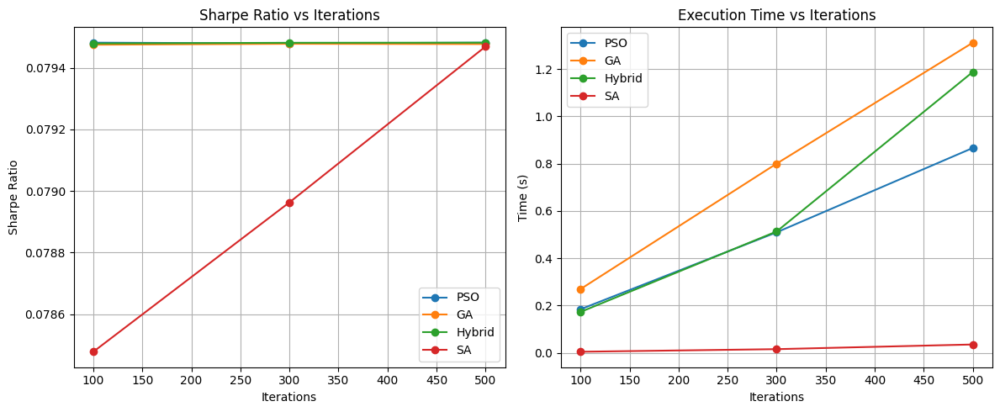

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your return data (replace with your actual returns DataFrame)
# Example: returns_df = pd.read_csv("returns.csv")
# For testing purposes:
# returns_df = pd.DataFrame(np.random.normal(0, 0.01, size=(252, 10)))
# Ensure this is available in your script


# Iteration settings
iteration_list = [100, 300, 500]

# Store results
results = {
    "PSO": [],
    "GA": [],
    "Hybrid": [],
    "SA": []
}

for iters in iteration_list:
    print(f"\nRunning for max_iter = {iters}\n{'-'*40}")

    # PSO
    _, best_score_pso, _, time_pso, _ = pso_optimize(returns_df, max_iter=iters)
    results["PSO"].append((best_score_pso, time_pso))
    print(f"PSO -> Best Sharpe Ratio: {best_score_pso:.5f}, Time: {time_pso:.2f}s")

    # GA
    _, best_score_ga, _, time_ga, _ = genetic_algorithm_optimize(returns_df, max_iter=iters)
    results["GA"].append((best_score_ga, time_ga))
    print(f"GA  -> Best Sharpe Ratio: {best_score_ga:.5f}, Time: {time_ga:.2f}s")

    # Hybrid
    _, best_score_hybrid, _, time_hybrid, _ = hybrid_pso_ga_optimize(returns_df, max_iter=iters)
    results["Hybrid"].append((best_score_hybrid, time_hybrid))
    print(f"Hybrid -> Best Sharpe Ratio: {best_score_hybrid:.5f}, Time: {time_hybrid:.2f}s")

    # SA
    _, best_score_sa, _, time_sa, _ = simulated_annealing_optimize(returns_df, max_iter=iters)
    results["SA"].append((best_score_sa, time_sa))
    print(f"SA -> Best Sharpe Ratio: {best_score_sa:.5f}, Time: {time_sa:.2f}s")

# Optional: Plotting comparison
plt.figure(figsize=(12, 5))

# Quality
plt.subplot(1, 2, 1)
for key in results:
    plt.plot(iteration_list, [v[0] for v in results[key]], marker='o', label=key)
plt.title("Sharpe Ratio vs Iterations")
plt.xlabel("Iterations")
plt.ylabel("Sharpe Ratio")
plt.grid(True)
plt.legend()

# Time
plt.subplot(1, 2, 2)
for key in results:
    plt.plot(iteration_list, [v[1] for v in results[key]], marker='o', label=key)
plt.title("Execution Time vs Iterations")
plt.xlabel("Iterations")
plt.ylabel("Time (s)")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()
